In [2]:
import pandas as pd
import numpy as np

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

np.set_printoptions(precision=4)
sns.set(font_scale=1.5)
plt.style.use('fivethirtyeight')

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

### Loading thge data

In [4]:
df = pd.read_csv('/Users/sandra/Desktop/Projects/air_clean_data.csv')
df.head()

,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station,dateInt,date
0,2013,3,1,0,4.0,4.0,3.0,50.638586,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling,20130301,2013-03-01
1,2013,3,1,1,7.0,7.0,3.0,50.638586,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling,20130301,2013-03-01
2,2013,3,1,2,5.0,5.0,3.0,2.000000,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling,20130301,2013-03-01
3,2013,3,1,3,6.0,6.0,3.0,50.638586,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling,20130301,2013-03-01
4,2013,3,1,4,5.0,5.0,3.0,50.638586,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling,20130301,2013-03-01


In [5]:
#converting year,month, day, hour columns into datetime format 
#and changing index into Date required for time series analysis
df['dateInt']=df['year'].astype(str) + df['month'].astype(str).str.zfill(2)+ df['day'].astype(str).str.zfill(2)+df['hour'].astype(str).str.zfill(2)
df['Date'] = pd.to_datetime(df['dateInt'], format='%Y%m%d%H')

In [6]:
df.set_index('Date', inplace=True)
df.head()

,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station,dateInt,date
Date,,,,,,,,,,,,,,,,,,,
2013-03-01 00:00:00,2013,3,1,0,4.0,4.0,3.0,50.638586,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling,2013030100,2013-03-01
2013-03-01 01:00:00,2013,3,1,1,7.0,7.0,3.0,50.638586,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling,2013030101,2013-03-01
2013-03-01 02:00:00,2013,3,1,2,5.0,5.0,3.0,2.000000,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling,2013030102,2013-03-01
2013-03-01 03:00:00,2013,3,1,3,6.0,6.0,3.0,50.638586,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling,2013030103,2013-03-01
2013-03-01 04:00:00,2013,3,1,4,5.0,5.0,3.0,50.638586,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling,2013030104,2013-03-01


#  Explanatory Data Analysis

In [7]:
cols_to_drop = ['year', 'month', 'day', 'hour']
df = df.drop(cols_to_drop, axis = 1)

## Group by EDA

## Daily data by station

In [8]:
daily_station_means = df.groupby('station').resample('D').mean()
daily_station_means

PM2.5        PM10        SO2         NO2  \
station       Date                                                        
Aotizhongxin  2013-03-01    7.125000   10.750000  11.708333   22.583333   
              2013-03-02   30.750000   42.083333  36.625000   66.666667   
              2013-03-03   76.916667  120.541667  61.291667   81.000000   
              2013-03-04   22.708333   44.583333  22.208333   47.109941   
              2013-03-05  148.875000  183.791667  93.875000  132.833333   
...                              ...         ...        ...         ...   
Wanshouxigong 2017-02-24   39.958333   48.916667   9.250000   52.041667   
              2017-02-25   16.875000   26.791667   3.958333   34.314764   
              2017-02-26   31.416667   48.916667   8.583333   57.303215   
              2017-02-27   66.500000   88.000000  13.750000   80.329823   
              2017-02-28   10.958333   21.541667   5.041667   32.193274   

                                   CO         O3       TEMP         PRES  \
station       Date                                                         
Aotizhongxin  2013-03-01   429.166667  63.875000   1.391667  1026.875000   
              2013-03-02   824.916667  29.750000   0.616667  1026.850000   
              2013-03-03  1620.625000  19.125000   5.566667  1014.608333   
              2013-03-04   629.166667  53.750000   9.962500  1017.650000   
              2013-03-05  2357.958333  68.458333   6.291667  1010.900000   
...                               ...        ...        ...          ...   
Wanshouxigong 2017-02-24   887.500000  39.250000   5.166667  1021.012500   
              2017-02-25   483.333333  52.750000   7.245833  1018.812500   
              2017-02-26   575.000000  35.416667   7.208333  1020.337500   
              2017-02-27  1387.500000  22.583333   8.337500  1017.141667   
              2017-02-28   545.833333  54.500000  10.958333  1014.887500   

                               DEWP  RAIN      WSPM  
station       Date                                   
Aotizhongxin  2013-03-01 -18.745833   0.0  3.254167  
              2013-03-02 -15.937500   0.0  1.479167  
              2013-03-03 -12.316667   0.0  1.658333  
              2013-03-04 -11.683333   0.0  2.404167  
              2013-03-05  -7.525000   0.0  1.129167  
...                             ...   ...       ...  
Wanshouxigong 2017-02-24 -11.141667   0.0  1.595833  
              2017-02-25 -10.754167   0.0  1.825000  
              2017-02-26  -8.258333   0.0  1.566667  
              2017-02-27  -7.145833   0.0  1.516667  
              2017-02-28 -12.783333   0.0  2.058333  

[17532 rows x 11 columns]

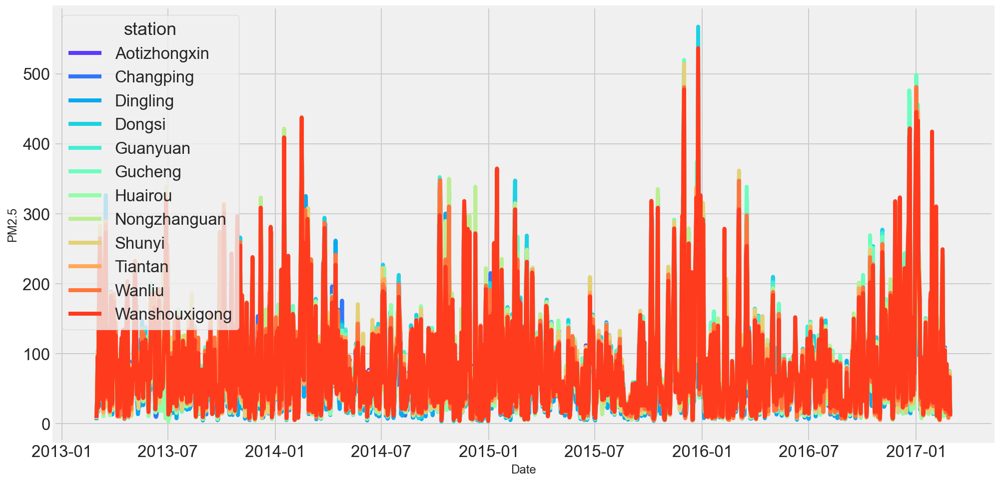

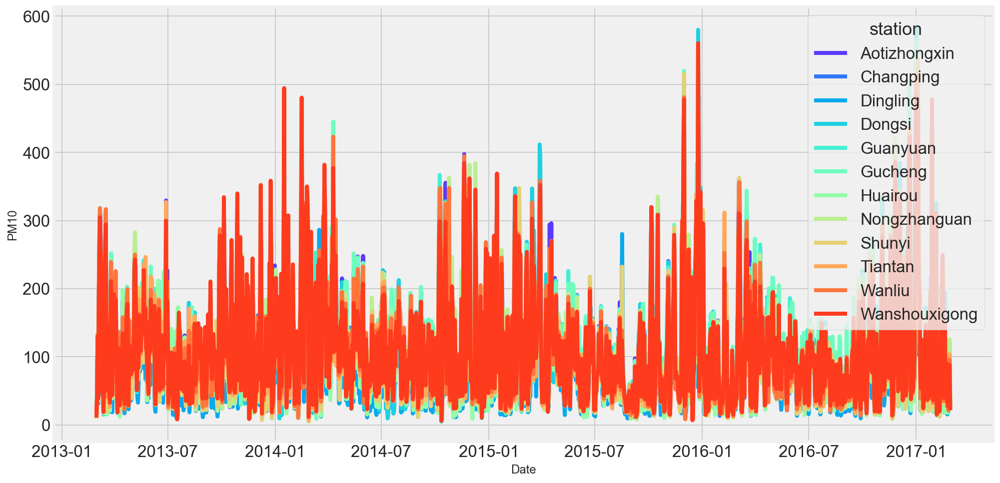

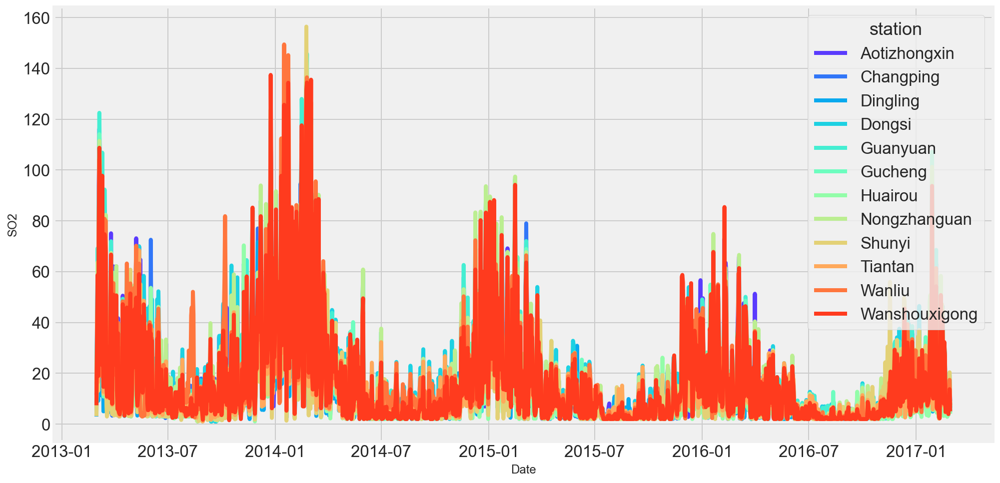

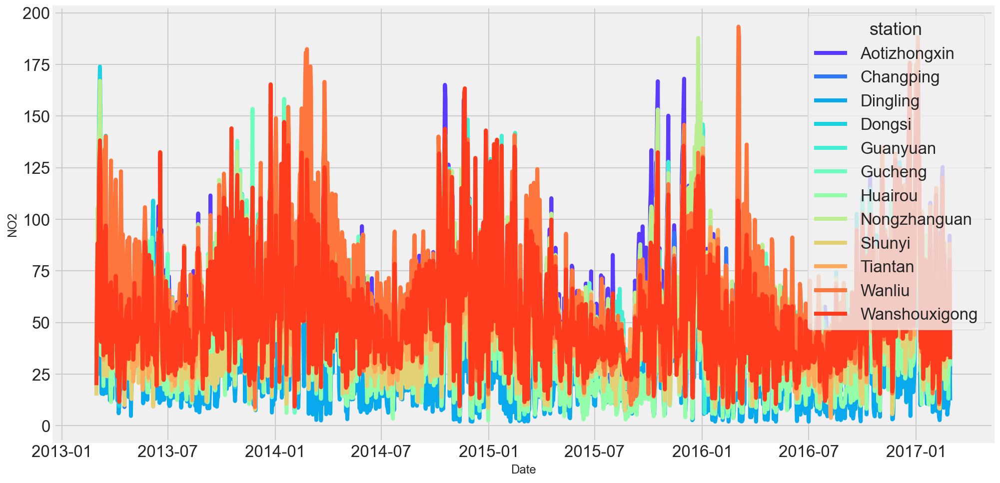

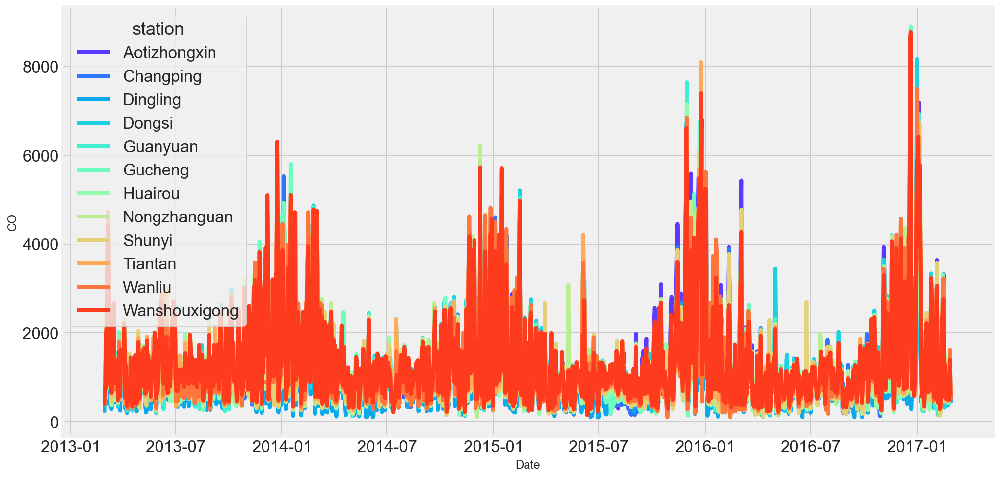

...

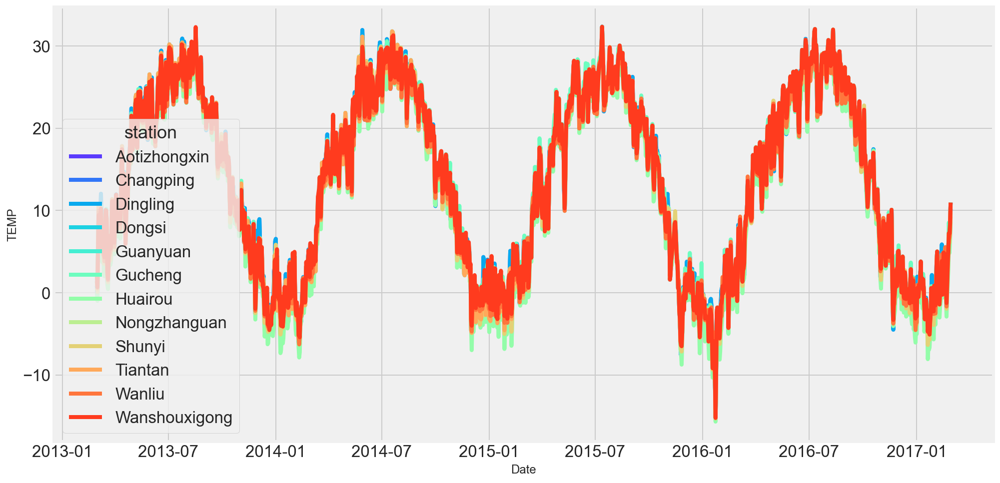

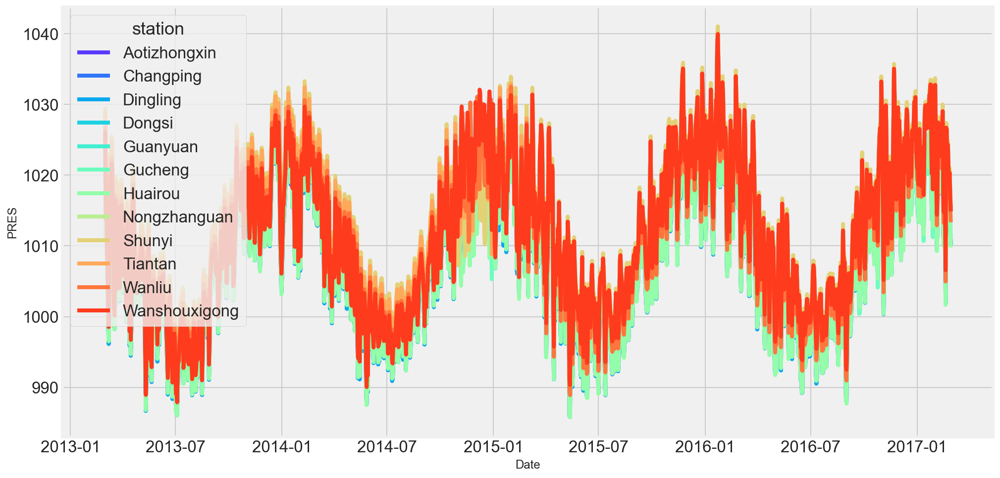

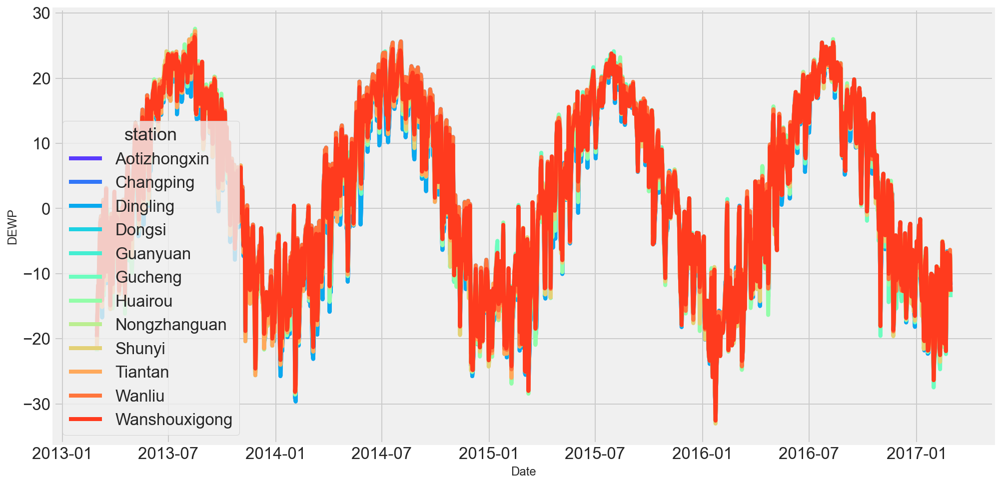

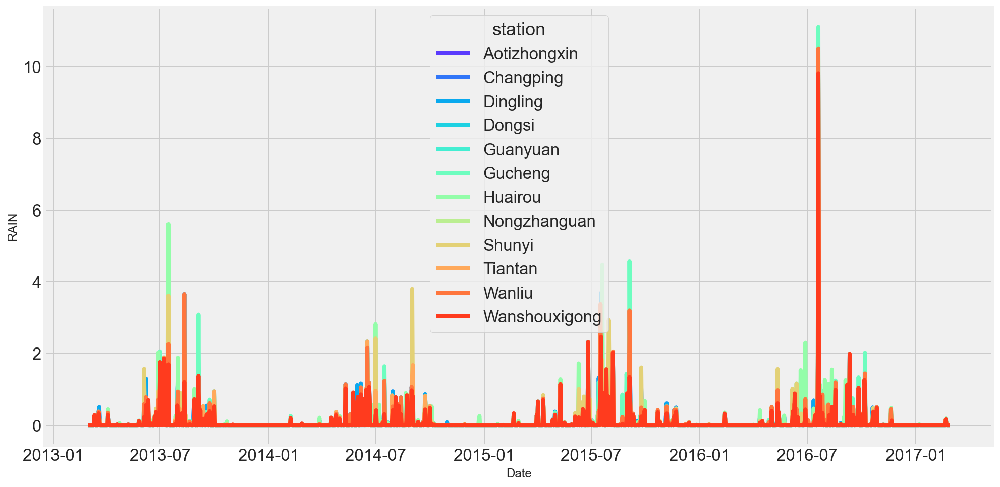

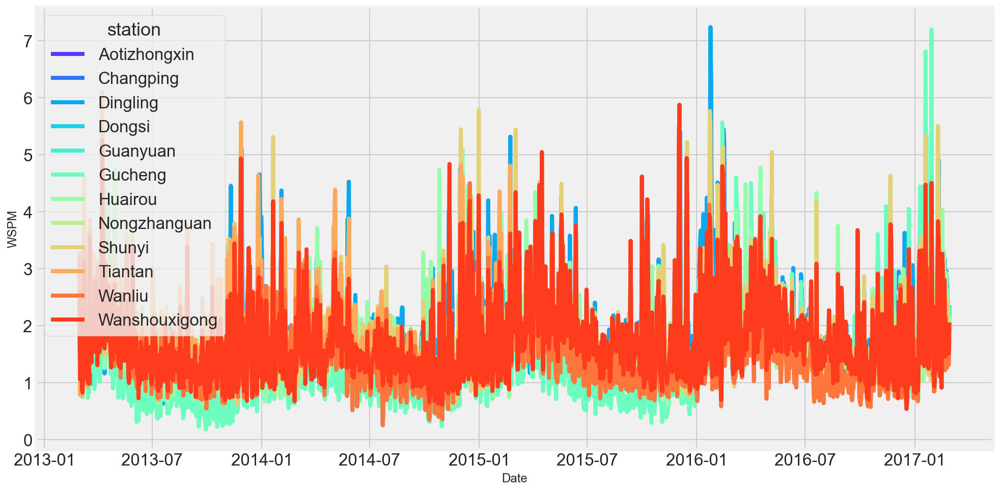

In [9]:
def plot_data(col):
    plt.figure(figsize=(15,8))
    sns.lineplot(y=col,x='Date',data=daily_station_means, hue= 'station', palette='rainbow')
    
for col in daily_station_means.columns:
    plot_data(col)

## Weekly data by station

In [10]:
weekly_station_means = df.groupby('station').resample('W').mean()
weekly_station_means

PM2.5        PM10        SO2        NO2  \
station       Date                                                       
Aotizhongxin  2013-03-03   38.263889   57.791667  36.541667  56.750000   
              2013-03-10  139.428571  197.458333  64.587086  97.201960   
              2013-03-17  157.071429  177.184524  57.416667  81.952381   
              2013-03-24   67.321429   92.511905  19.750000  55.160714   
              2013-03-31  107.333333  145.422619  40.119048  72.244048   
...                              ...         ...        ...        ...   
Wanshouxigong 2017-02-05  112.833333  119.059524  27.666667  57.565476   
              2017-02-12   43.987952   61.487952  15.536145  40.190594   
              2017-02-19  122.479042  138.898204  26.065868  78.281437   
              2017-02-26   38.851190   51.250000   7.017857  44.353131   
              2017-03-05   38.729167   54.770833   9.395833  56.261549   

                                   CO         O3      TEMP         PRES  \
station       Date                                                        
Aotizhongxin  2013-03-03   958.236111  37.583333  2.525000  1022.777778   
              2013-03-10  1994.994048  59.529762  7.797619  1008.958929   
              2013-03-17  1701.619048  65.720238  6.402976  1014.233929   
              2013-03-24   987.458333  38.906575  4.535119  1009.782738   
              2013-03-31  1235.529762  29.868190  6.991071  1012.829762   
...                               ...        ...       ...          ...   
Wanshouxigong 2017-02-05  1454.761905  40.898810  0.768304  1024.101984   
              2017-02-12   866.867470  49.915663  0.677410  1025.389759   
              2017-02-19  1654.491018  34.269461  2.862874  1019.890419   
              2017-02-26   714.880952  43.541667  3.425000  1022.414881   
              2017-03-05   966.666667  38.541667  9.647917  1016.014583   

                               DEWP      RAIN      WSPM  
station       Date                                       
Aotizhongxin  2013-03-03 -15.666667  0.000000  2.130556  
              2013-03-10  -7.088690  0.000000  2.006548  
              2013-03-17  -2.277976  0.017262  1.599405  
              2013-03-24  -5.529762  0.098810  2.416667  
              2013-03-31  -3.762500  0.000000  1.922024  
...                             ...       ...       ...  
Wanshouxigong 2017-02-05 -18.331548  0.000000  1.704167  
              2017-02-12 -17.030723  0.000000  2.378916  
              2017-02-19 -11.585030  0.000000  1.982635  
              2017-02-26 -11.811905  0.024405  1.903571  
              2017-03-05  -9.964583  0.000000  1.787500  

[2520 rows x 11 columns]

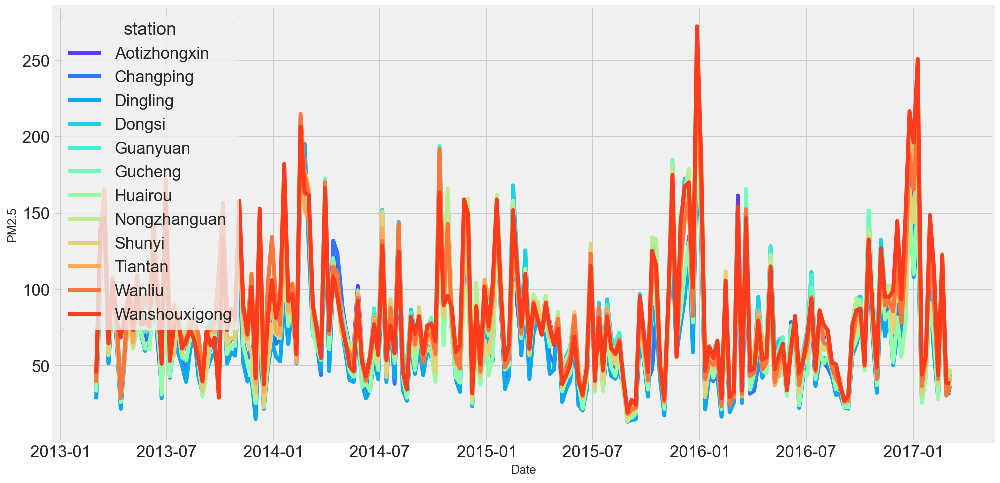

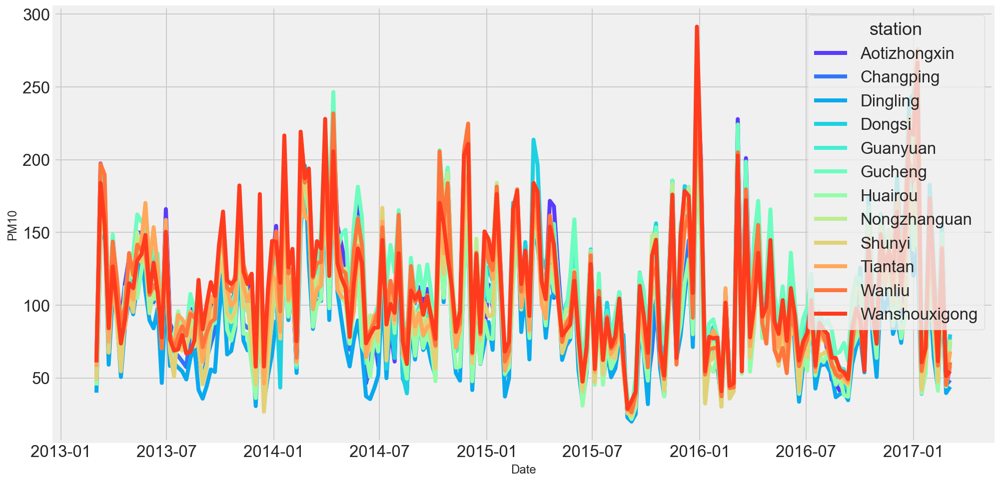

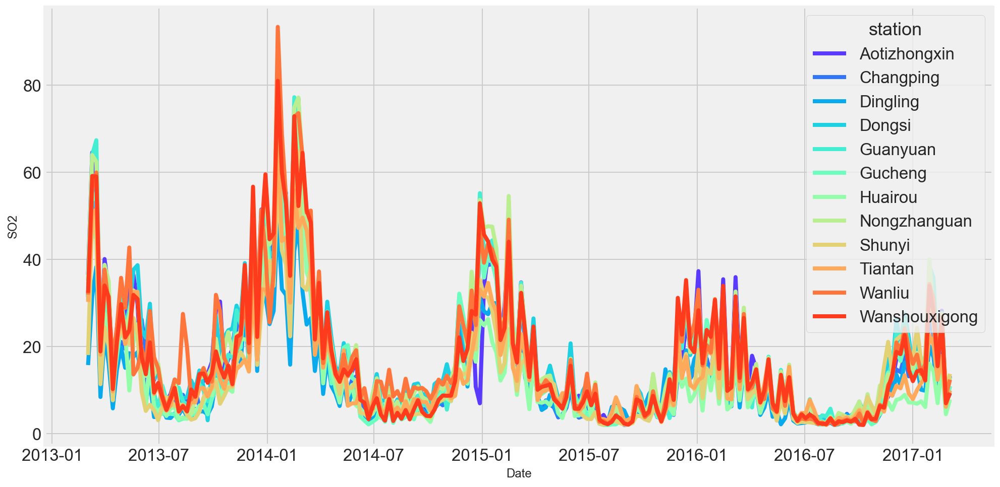

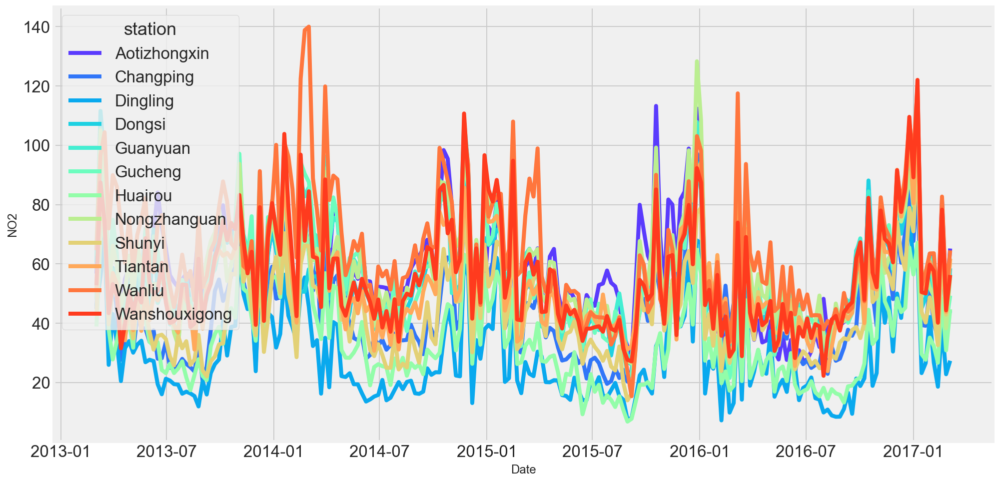

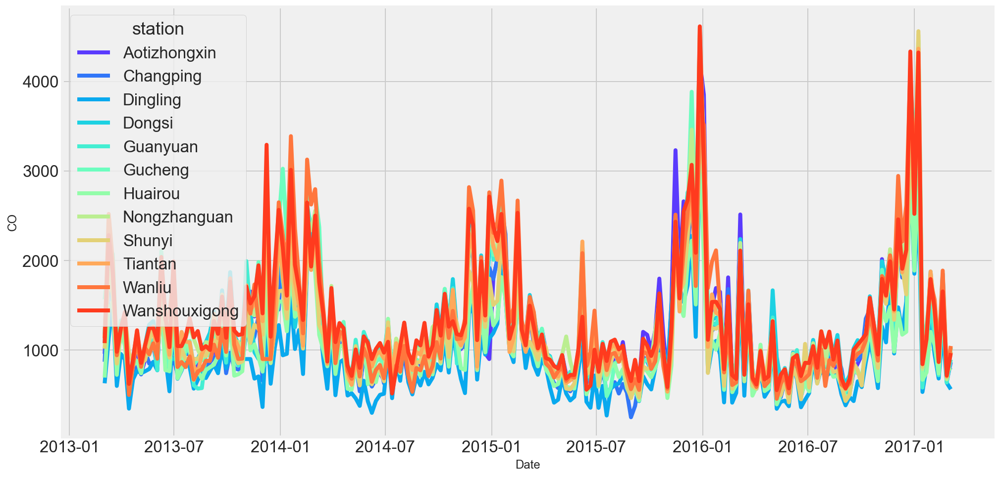

...

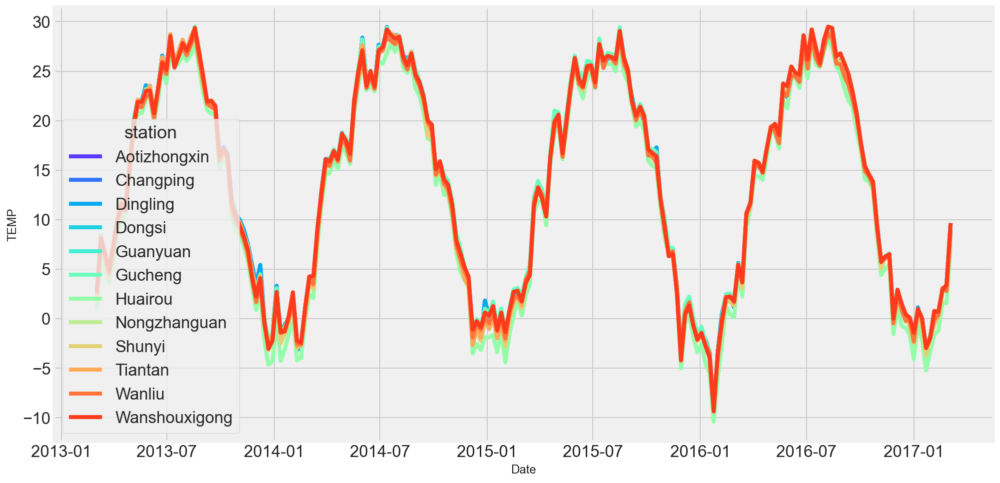

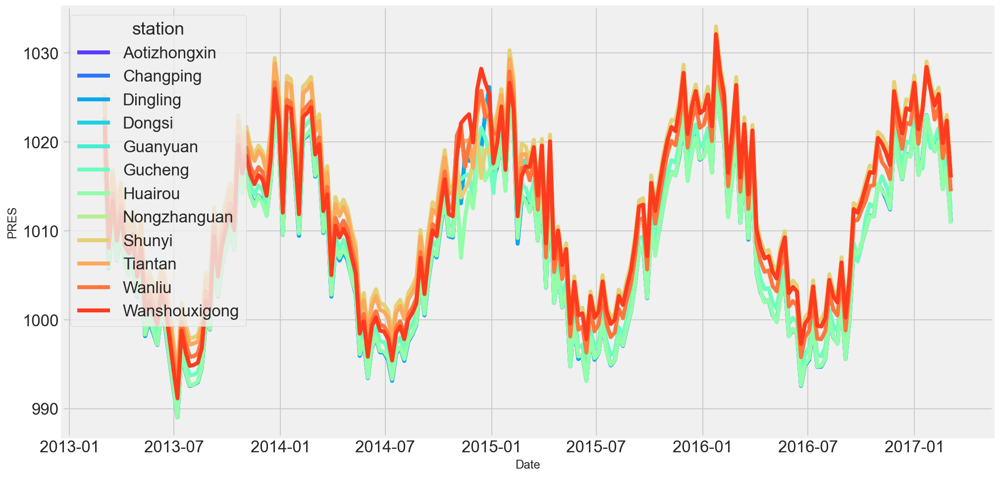

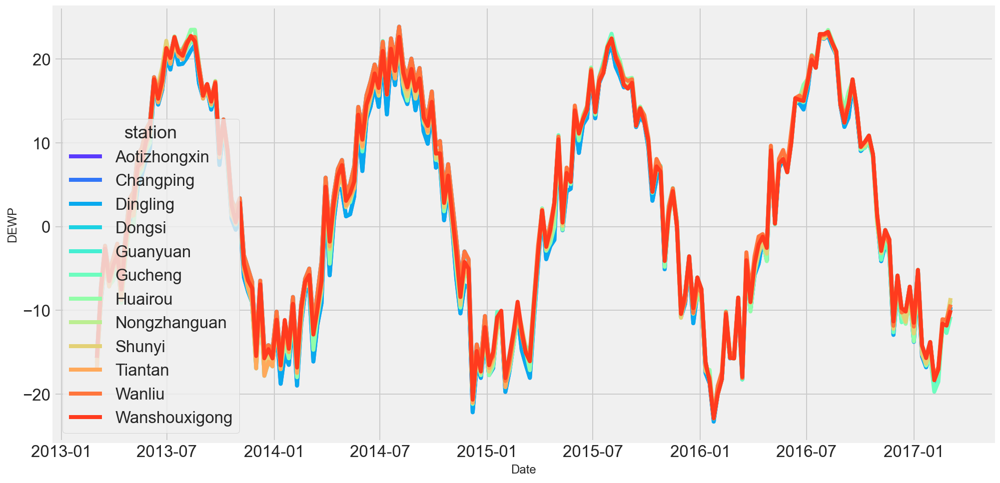

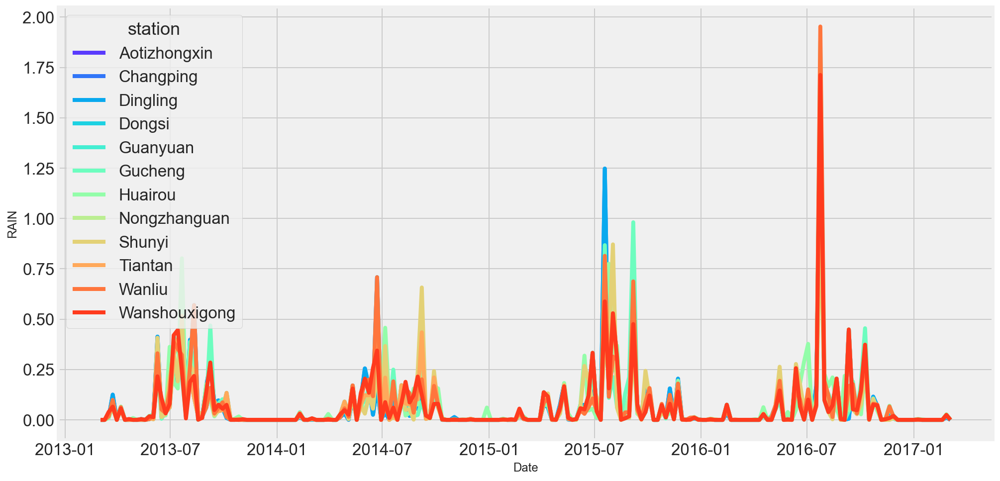

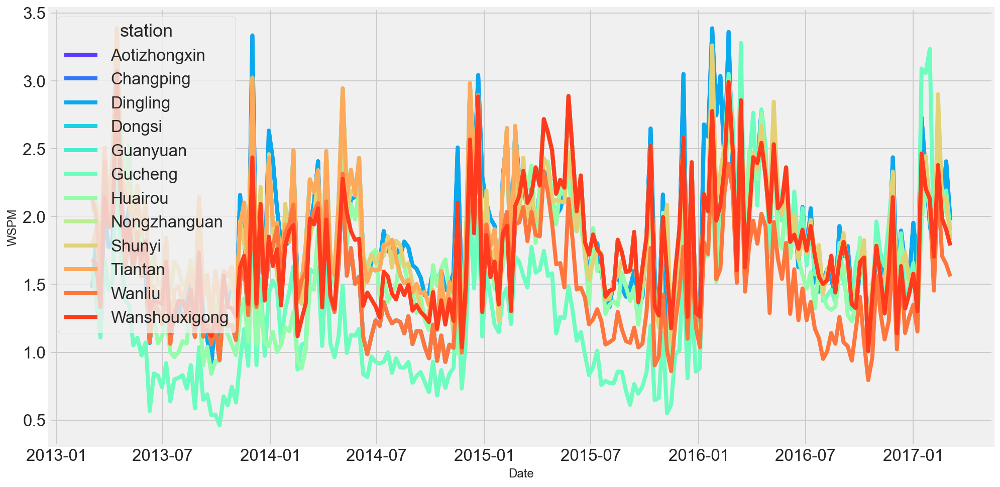

In [11]:
def plot_data(col):
    plt.figure(figsize=(15,8))
    sns.lineplot(y=col ,x='Date',data=weekly_station_means, hue= 'station', palette='rainbow')
    
    
for col in weekly_station_means.columns:
    plot_data(col)

## Monthly data by stations

In [12]:
monthly_station_means = df.groupby('station').resample('1M').mean()
monthly_station_means

PM2.5        PM10        SO2        NO2  \
station       Date                                                       
Aotizhongxin  2013-03-31  110.092742  143.916667  44.604342  74.714959   
              2013-04-30   62.751389  108.204167  24.676507  53.243693   
              2013-05-31   84.907258  140.778226  30.442204  61.016129   
              2013-06-30  106.012500  128.716667  14.499177  72.641179   
              2013-07-31   68.911290   85.361559   9.286576  55.119195   
...                              ...         ...        ...        ...   
Wanshouxigong 2016-10-31   83.190476   94.100680   3.315646  60.823506   
              2016-11-30  106.422378  136.352448  10.523077  71.514685   
              2016-12-31  156.863514  169.177027  17.364865  89.932205   
              2017-01-31  132.803073  150.321229  18.272346  71.119102   
              2017-02-28   77.662182   91.568012  18.313901  56.679401   

                                   CO         O3       TEMP         PRES  \
station       Date                                                         
Aotizhongxin  2013-03-31  1429.416667  47.449141   6.053629  1012.547446   
              2013-04-30   914.805556  49.789494  12.260694  1008.296944   
              2013-05-31   928.985215  73.124207  21.374194  1003.162231   
              2013-06-30  1213.359722  69.456723  23.386111  1000.165556   
              2013-07-31   820.016129  71.769638  26.877419   996.033065   
...                               ...        ...        ...          ...   
Wanshouxigong 2016-10-31  1241.768707  20.461224  13.400346  1017.161100   
              2016-11-30  1811.888112  14.121678   4.434545  1020.589510   
              2016-12-31  2610.405405  15.404054   0.655000  1023.474054   
              2017-01-31  2100.000000  28.096369  -1.002705  1024.959218   
              2017-02-28  1174.738416  41.180867   2.678401  1022.025461   

                               DEWP      RAIN      WSPM  
station       Date                                       
Aotizhongxin  2013-03-31  -5.729435  0.026210  2.000134  
              2013-04-30  -1.553611  0.015139  2.209722  
              2013-05-31   9.790457  0.007796  1.740457  
              2013-06-30  18.009028  0.130694  1.240000  
              2013-07-31  21.459946  0.293817  1.278763  
...                             ...       ...       ...  
Wanshouxigong 2016-10-31   7.293469  0.118912  1.491973  
              2016-11-30  -3.767972  0.007413  1.568112  
              2016-12-31  -9.276486  0.000000  1.443108  
              2017-01-31 -12.720251  0.000419  1.998603  
              2017-02-28 -13.642451  0.006129  1.962033  

[576 rows x 11 columns]

In [13]:
monthly_station_means

PM2.5        PM10        SO2        NO2  \
station       Date                                                       
Aotizhongxin  2013-03-31  110.092742  143.916667  44.604342  74.714959   
              2013-04-30   62.751389  108.204167  24.676507  53.243693   
              2013-05-31   84.907258  140.778226  30.442204  61.016129   
              2013-06-30  106.012500  128.716667  14.499177  72.641179   
              2013-07-31   68.911290   85.361559   9.286576  55.119195   
...                              ...         ...        ...        ...   
Wanshouxigong 2016-10-31   83.190476   94.100680   3.315646  60.823506   
              2016-11-30  106.422378  136.352448  10.523077  71.514685   
              2016-12-31  156.863514  169.177027  17.364865  89.932205   
              2017-01-31  132.803073  150.321229  18.272346  71.119102   
              2017-02-28   77.662182   91.568012  18.313901  56.679401   

                                   CO         O3       TEMP         PRES  \
station       Date                                                         
Aotizhongxin  2013-03-31  1429.416667  47.449141   6.053629  1012.547446   
              2013-04-30   914.805556  49.789494  12.260694  1008.296944   
              2013-05-31   928.985215  73.124207  21.374194  1003.162231   
              2013-06-30  1213.359722  69.456723  23.386111  1000.165556   
              2013-07-31   820.016129  71.769638  26.877419   996.033065   
...                               ...        ...        ...          ...   
Wanshouxigong 2016-10-31  1241.768707  20.461224  13.400346  1017.161100   
              2016-11-30  1811.888112  14.121678   4.434545  1020.589510   
              2016-12-31  2610.405405  15.404054   0.655000  1023.474054   
              2017-01-31  2100.000000  28.096369  -1.002705  1024.959218   
              2017-02-28  1174.738416  41.180867   2.678401  1022.025461   

                               DEWP      RAIN      WSPM  
station       Date                                       
Aotizhongxin  2013-03-31  -5.729435  0.026210  2.000134  
              2013-04-30  -1.553611  0.015139  2.209722  
              2013-05-31   9.790457  0.007796  1.740457  
              2013-06-30  18.009028  0.130694  1.240000  
              2013-07-31  21.459946  0.293817  1.278763  
...                             ...       ...       ...  
Wanshouxigong 2016-10-31   7.293469  0.118912  1.491973  
              2016-11-30  -3.767972  0.007413  1.568112  
              2016-12-31  -9.276486  0.000000  1.443108  
              2017-01-31 -12.720251  0.000419  1.998603  
              2017-02-28 -13.642451  0.006129  1.962033  

[576 rows x 11 columns]

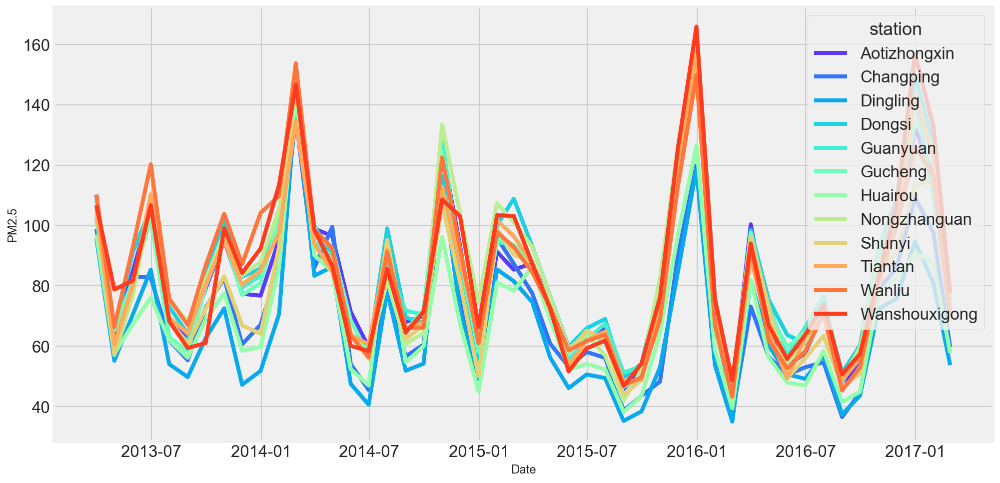

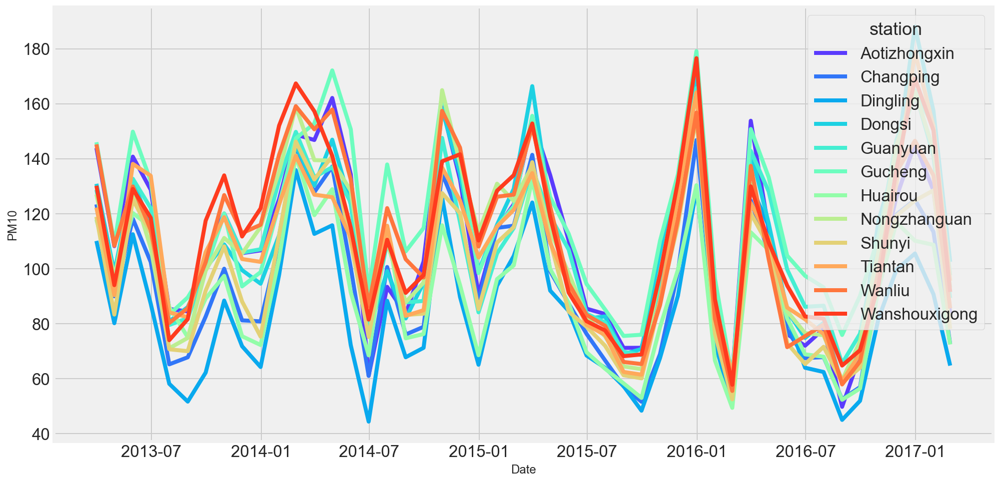

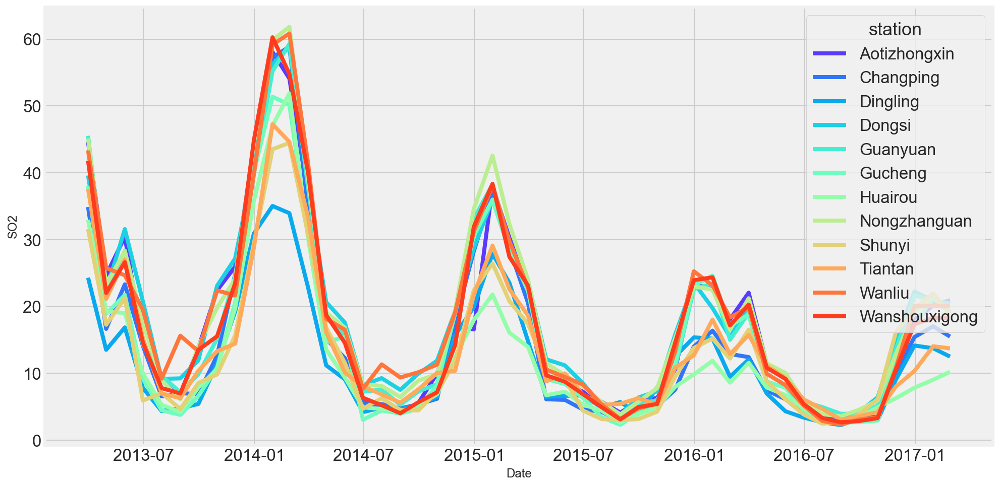

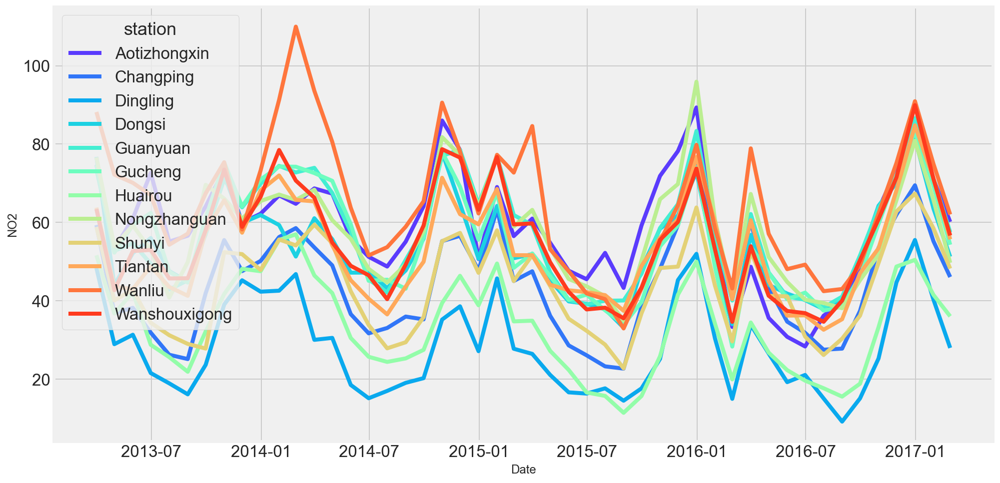

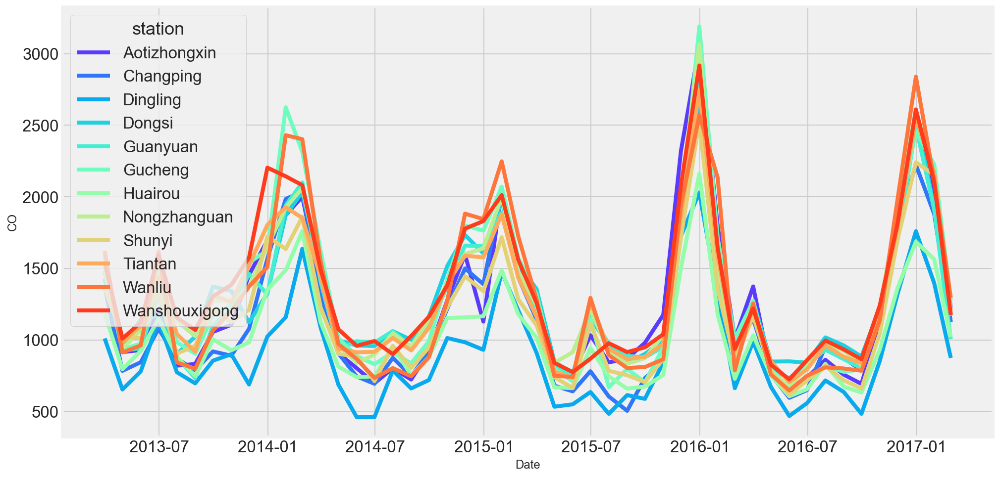

...

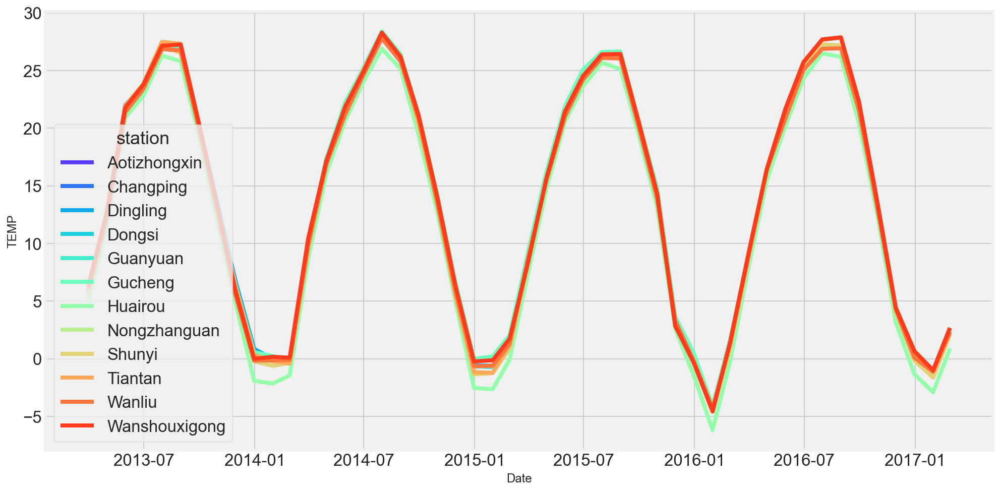

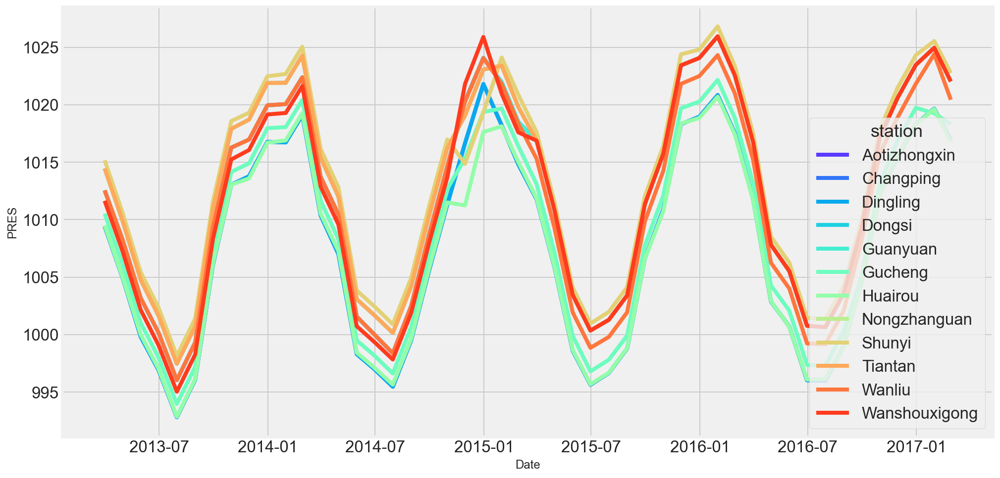

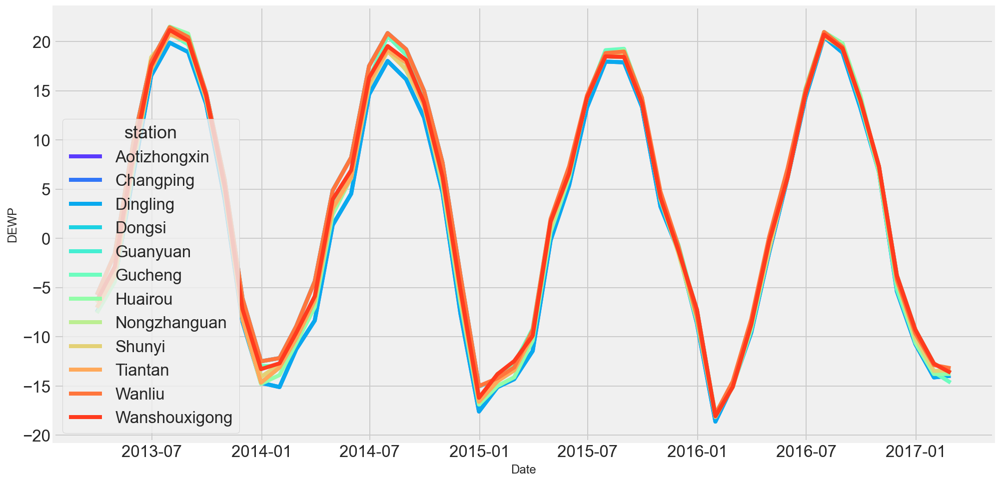

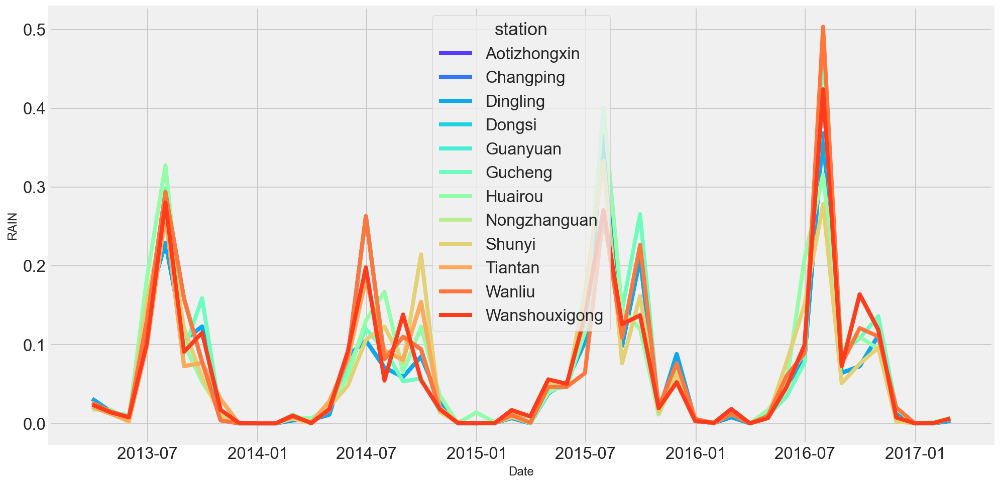

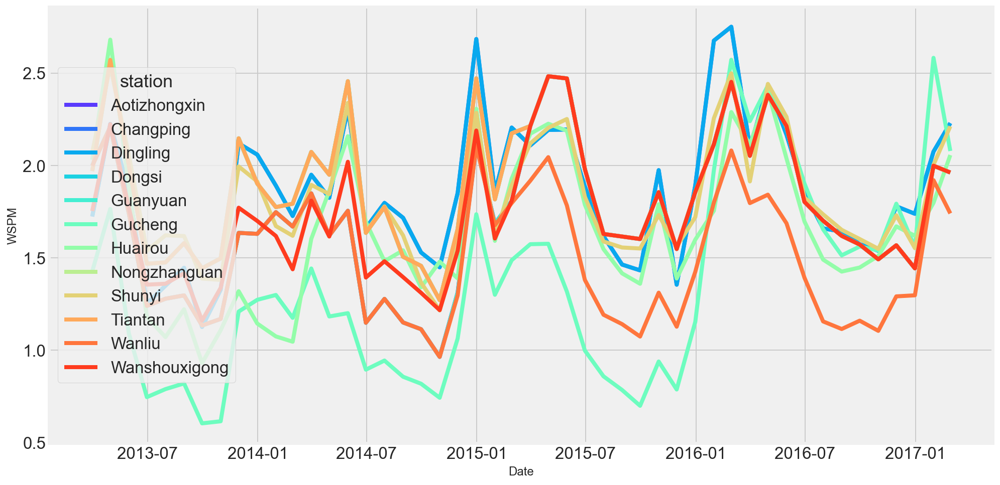

In [14]:
def plot_data(col):
    plt.figure(figsize=(15,8))
    sns.lineplot(y=col ,x='Date',data=monthly_station_means, hue= 'station', palette='rainbow')
    
    
for col in monthly_station_means.columns:
    plot_data(col)